In [11]:
from google.colab import drive
import pandas as pd
drive.mount('/content/drive')
df = pd.read_csv('/content/drive/Shareddrives/PFA/profiles.csv')
# Path to the zip file containing images
photos = '/content/drive/Shareddrives/PFA/batches'
batches = '/content/drive/Shareddrives/PFA/batches'
df.tail(50)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,_id,bio,categories,followees,followers,posts,username
857,665bbea6298f4415665e3b4b,Welcome to the official GYM WAY Aouina Instagr...,"[""Sports""]",50,35.7K,"[{""caption"":""Check our new planning starting f...",gym_way_aouina
858,665bc348143ebec0aeb7f96c,#hesifam\nAAU @mena.basketball 🇨🇦\nAgency @hes...,"[""Sports""]","1,022","9,943","[{""caption"":""When it comes to recruiting inter...",hesibasketball
859,665bc427143ebec0aeb7f96d,Professional tennis player 🎾 | La Marsa 🇹🇳|\nS...,"[""Sports""]",895,"6,380","[{""caption"":""Unforgettable emotions and memori...",_azizdougaz_
860,665bc4f7143ebec0aeb7f96e,player🎾 لاعب تنس محترف Olympian 🇹🇳 🇫🇷 Davis cu...,"[""Sports""]",221,47.7K,"[{""caption"":""Second Video recap of the highly ...",jazirimalek
861,665bc597143ebec0aeb7f96f,Tunisian Padel Player 🇹🇳\nTennis & Padel Coach...,"[""Sports""]","2,789","7,588","[{""caption"":"" ✨📸 Plongez dans les moments fort...",allaninour
862,665bc676143ebec0aeb7f970,◯‍◯‍◯‍◯‍◯ Olympian Paris 24'\n🎾 Professional T...,"[""Sports""]",532,"3,943","[{""caption"":""Unforgettable moment 🥺🙏🏼🧿. . . A ...",moezechargui
863,665bc74f143ebec0aeb7f971,🇹🇳🇺🇸📍\n•𝗣𝗿𝗼𝗳𝗲𝘀𝘀𝗶𝗼𝗻𝗮𝗹 𝗙𝗼𝗼𝘁𝗯𝗮𝗹𝗹 𝗣𝗹𝗮𝘆𝗲𝗿 𝗔𝘁 @etoil...,"[""Sports""]",584,60.1K,"[{""caption"":""Photo by 𝐉𝐀𝐙𝐙 🦅 on February 21, 2...",jasser_khmiri20
864,665bcd9e6f408030f6d75b7c,• Professional football player @atromitosathin...,"[""Sports""]",229,137K,"[{""caption"":""Photo by Wajdi Kechrida on Novemb...",w_kechrida24
865,665bce826f408030f6d75b7d,For business inquiries: @jeel.media\nAfrican G...,"[""Sports""]",307,195K,"[{""caption"":""أستوديو نهائي دوري الأبطال: \""الد...",tarak_dhiab
866,665bcf576f408030f6d75b7e,▪️Head coach\n▪️Former Tunisian captain\n▪️Hus...,"[""Sports""]",613,171K,"[{""caption"":"""",""imageUrl"":""https://scontent-at...",radhijaidi


**Categories**

(907, 7)
{'Personal Blog': 132, 'Animals': 100, 'Sports': 92, 'Travel': 90, 'Fashion & Beauty': 88, 'Education': 83, 'Acting': 83, 'Food': 81, 'Doctor': 75, 'Music': 73, 'Beauty & Makeup': 51, 'Art': 28, 'Photography': 17, 'Store': 7, 'Comedy': 3, 'Animation and Cosplay': 3, 'Personal blog': 2, 'Auto and Vehicles': 2, 'Marketing and Advertising': 2, 'family': 1, 'Video Gaming': 1, 'News & Politics': 1, 'News': 1, 'Piercing': 1, 'Journalists': 1, 'Celebrity': 1, 'Family': 1, 'Finance': 1, 'Photograph': 1, 'Business and Finance': 1, 'thevmaker': 1}


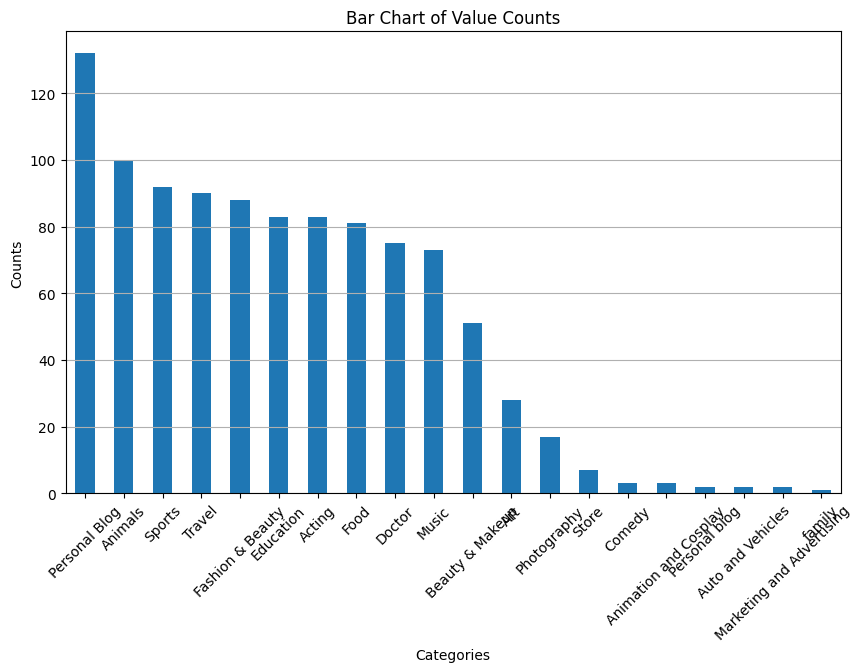

Most common pairs of categories:
('Personal Blog', 'Fashion & Beauty') : 15
('Acting', 'Fashion & Beauty') : 13
('Travel', 'Personal Blog') : 11
('Beauty & Makeup', 'Fashion & Beauty') : 8
('Music', 'Personal Blog') : 7
('Fashion & Beauty', 'Music') : 6
('Fashion & Beauty', 'Personal Blog') : 6
('Travel', 'Fashion & Beauty') : 5
('Travel', 'Food') : 5
('Fashion & Beauty', 'Beauty & Makeup') : 4


In [13]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
from collections import Counter

print(df.shape)
null_cats = df['categories'].isnull().sum()
nan_cats = df['categories'].isna().sum()
filtered_df = df[df['categories'].apply(lambda x : isinstance(x,list))]
import ast

def clean_categories(x):
  if isinstance(x,float):
    return []
  return x
df['categories'] = df['categories'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

clean_df = df['categories'].fillna("").apply(list)
clean_df = df['categories'].apply(clean_categories)

category_counts = clean_df.explode().value_counts()
print(dict(category_counts))
plt.figure(figsize=(10, 6))
category_counts[:20].plot(kind='bar')
plt.title('Bar Chart of Value Counts')
plt.xlabel('Categories')
plt.ylabel('Counts')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

pair_counts = Counter()

# Iterate over the lists in the 'categories' column and count pairs of categories
for categories in clean_df:
    category_pairs = combinations(categories, 2)  # Generate all possible pairs of categories
    pair_counts.update(category_pairs)  # Count the pairs

# Print the most common pairs of categories
most_common_pairs = pair_counts.most_common(10)  # Change 10 to the desired number of pairs to display
print("Most common pairs of categories:")
for pair, count in most_common_pairs:
    print(pair, ":", count)

Most common pairs of categories:
('Fashion & Beauty', 'Personal Blog') : 21
('Acting', 'Fashion & Beauty') : 13
('Personal Blog', 'Travel') : 12
('Fashion & Beauty', 'Music') : 8
('Music', 'Personal Blog') : 7
('Fashion & Beauty', 'Travel') : 5
('Food', 'Travel') : 5
('Food', 'Personal Blog') : 4
('Animals', 'Education') : 4
('Personal Blog', 'Sports') : 3


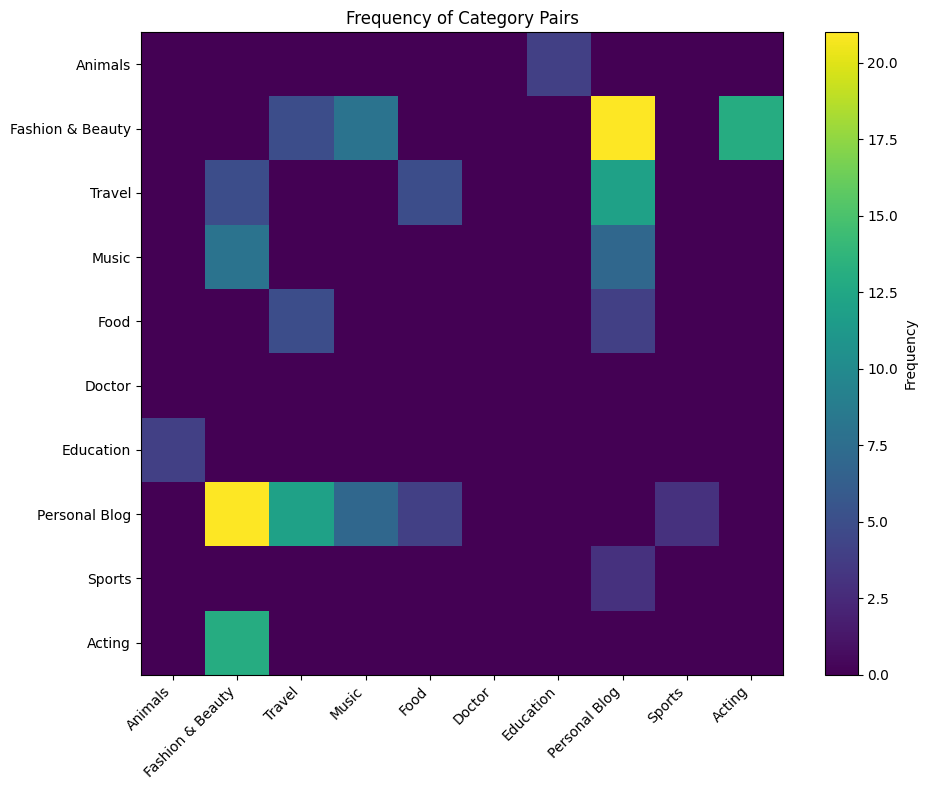

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations
from collections import Counter
import pandas as pd

# Define the desired categories
desired_categories = ['Animals','Fashion & Beauty','Travel', 'Music', 'Food', 'Doctor', 'Education', 'Personal Blog', 'Sports', 'Acting' ]

# Filter the DataFrame to include only the desired categories

# Count the pairs of categories
pair_counts = Counter()
for categories_list in clean_df:
    pairs = combinations(sorted(categories_list), 2)
    pair_counts.update(pairs)

# Filter pair_counts to include only pairs with desired categories
filtered_pair_counts = {pair: count for pair, count in pair_counts.items() if pair[0] in desired_categories and pair[1] in desired_categories}

# Get the most common pairs (you can change the number of pairs to display)
most_common_pairs = Counter(filtered_pair_counts).most_common(10)
print("Most common pairs of categories:")
for pair, count in most_common_pairs:
    print(pair, ":", count)

# Extract pairs and counts
pairs = [pair for pair, _ in most_common_pairs]
counts = [count for _, count in most_common_pairs]

# Create a matrix to store counts
category_list = desired_categories
matrix_size = len(category_list)
matrix = np.zeros((matrix_size, matrix_size))

# Fill the matrix with counts
category_index = {category: i for i, category in enumerate(category_list)}
for (cat1, cat2), count in most_common_pairs:
    i = category_index[cat1]
    j = category_index[cat2]
    matrix[i, j] = count
    matrix[j, i] = count

# Plotting the heatmap
plt.figure(figsize=(10, 8))
plt.imshow(matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Frequency')
plt.title('Frequency of Category Pairs')
plt.xticks(np.arange(matrix_size), category_list, rotation=45, ha='right')
plt.yticks(np.arange(matrix_size), category_list)
plt.tight_layout()
plt.show()


**Bios**

In [15]:
bio = df['bio']
print('users without bios', bio.isna().sum())
bio = bio.fillna('')
bio_lengths = bio.apply(lambda x:len(x.split()) if isinstance(x,str) else 0)
print('average bio length',bio_lengths.mean())

users without bios 9
average bio length 14.160970231532525


**Posts**

In [16]:
import json

df['posts'].fillna('').apply(list)
posts = df['posts'].apply(lambda x: len(json.loads(x)))
average_posts_per_user = posts.mean()
total = posts.sum()
print('average N° of posts per user', average_posts_per_user)
print('total number of posts', total)

average N° of posts per user 46.36493936052922
total number of posts 42053


In [17]:
posts = df['posts'].apply(lambda x: json.loads(x))
posts = posts.explode()

print(posts.head())
captions = posts.apply(lambda x: x['caption'] if isinstance(x,dict) else None)
print(captions.head())
captions = captions.fillna('')
print(captions.isna().sum())
caption_lengths = captions.copy().apply(lambda x: len(x))

print('average caption length and std',caption_lengths.mean(), caption_lengths.std())

0    {'caption': 'Ne ratez pas les méga ventes flas...
0    {'caption': 'كمندي l'hachoir végétale في Vente...
0    {'caption': 'Protégez votre peau avec SVR et n...
0    {'caption': 'Préparez-vous à détendre vos musc...
0    {'caption': 'Photo by Jumia Tunisie on March 2...
Name: posts, dtype: object
0    Ne ratez pas les méga ventes flash et commande...
0    كمندي l'hachoir végétale في Vente Flash اليوم ...
0    Protégez votre peau avec SVR et ne manquez pas...
0    Préparez-vous à détendre vos muscles ! 🌟 Notre...
0    Photo by Jumia Tunisie on March 25, 2024. May ...
Name: posts, dtype: object
0
average caption length and std 135.4728319025991 227.51929361956127


**Followers**

In [18]:
def format_number(number_str):
    if not isinstance(number_str, str):
      if isinstance(number_str,int):
        return number_str
      else:
        return 0
    number_str = number_str.replace(',','.')
    if 'K' in number_str:
        return int(float(number_str.replace('K', '')) * 1000)
    elif 'M' in number_str:
        return int(float(number_str.replace('M', '')) * 1000000)
    else:
        return int(float(number_str))
followers = df['followers'].apply(format_number)
followers.head()
print('average number of followers', followers.mean(), followers.std())

average number of followers 425288.0882028666 1329726.128302367


**Emojis**

In [19]:
import re
def count_emojis():
   emoji_pattern = r'(\u00a9|\u00ae|[\u2000-\u3300]|\ud83c[\ud000-\udfff]|\ud83d[\ud000-\udfff]|\ud83e[\ud000-\udfff])'
   emoji_count = len(re.findall(emoji_pattern, captions.str.cat()))
   return emoji_count
emojis_count = count_emojis()
print('emojis count', emojis_count)
print('average of emojis in text', emojis_count / len(captions.str.cat()))

emojis count 47737
average of emojis in text 0.008379265088408206


**Languages**

In [ ]:
!pip install langdetect
import json
import matplotlib.pyplot as plt

from langdetect import detect
from collections import defaultdict

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993227 sha256=3e4c057aae42016331c93f2430ab29acfa6ecc97049437973b31db029350d5f7
  Stored in directory: /root/.cache/pip/wheels/95/03/7d/59ea870c70ce4e5a370638b5462a7711ab78fba2f655d05106
Successfully built langdetect


In [ ]:
import json

# Dictionary to store language counts for captions and hashtags
language_counts = defaultdict(int)
captions_by_language = defaultdict(list)
hashtags_by_language = defaultdict(list)
bios_by_language = defaultdict(list)

# Iterate through each row of the DataFrame
for index, row in df.iterrows():
    # Iterate through each post of the influencer
    posts = row.get("posts")
    bio = row.get("bio","")
    if isinstance(bio, str) :  # Check if bio is a non-empty string
        try:
            # Detect language of the bio
            bio_language = detect(bio)
            # Increment the count for the detected language
            language_counts[bio_language] += 1
            bios_by_language[bio_language].append(bio)
        except:
            # Handle exceptions if language detection fails
            pass



    if isinstance(posts, str) and posts.startswith('['):
        try:
            # Convert the string representation of 'posts' into a list
            posts_list = json.loads(posts)

            for post in posts_list:
                if isinstance(post, dict):
                    caption = post.get("caption")
                    hashtags = post.get("hashtags", '[]')

                    # Detect language of the caption
                    try:
                        language = detect(caption)
                        # Increment the count for the detected language
                        language_counts[language] += 1
                        captions_by_language[language].append(caption)
                        if isinstance(hashtags, list):
                          for hashtag in hashtags:
                              if hashtag:  # Check if hashtag is not null or empty
                                  hashtag_language = detect(hashtag)
                                  hashtags_by_language[hashtag_language].append(hashtag)

                    except:
                        # Handle exceptions if language detection fails
                        pass

        except ValueError:
            # Handle exceptions if the string cannot be parsed as JSON
            continue
    else:
        continue





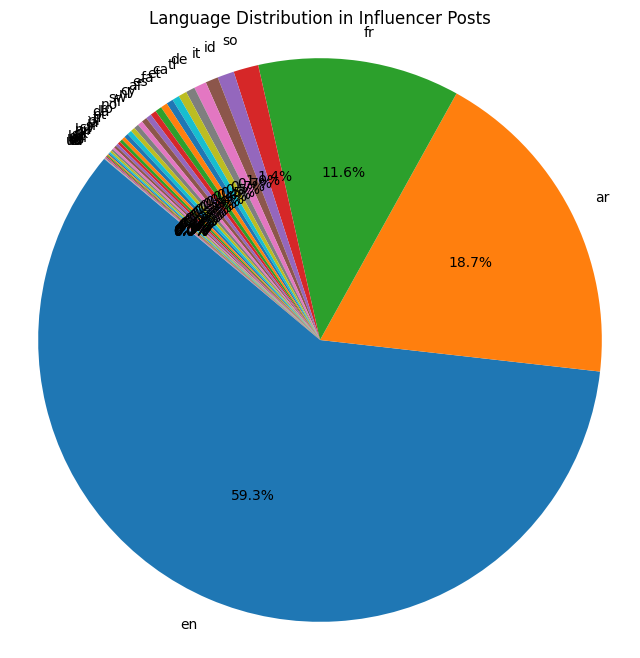

In [ ]:
top_languages = sorted(language_counts.items(), key=lambda x: x[1], reverse=True)[:]
languages = [language for language, _ in top_languages]
counts = [count for _, count in top_languages]
plt.figure(figsize=(8, 8))
plt.pie(counts, labels=languages, autopct='%1.1f%%', startangle=140)
plt.title('Language Distribution in Influencer Posts')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

In [ ]:

# Print the language counts
print("----------Language counts:----------")
for language, count in language_counts.items():
    print(f"{language}, Count: {count}")

# Print the language counts for bios
print("----------bios by language:----------:")
for language, bios in bios_by_language.items():
    print(f"{language},: {bios}")

# Print the language counts for hashtags
print("\n----------Language counts for hashtags:----------")
for language, hashtags in hashtags_by_language.items():
    print(f"{language},: {hashtags}")

# Print the language counts for hashtags
print("\n----------Language counts for hashtags:----------")
for language, captions in captions_by_language.items():
    print(f"{language},: {captions}")



IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



**Display Images:**

In [32]:
import matplotlib.pyplot as plt

def display_images_2(images_array, titles=None):
    ncols = 5
    nimages = len(images_array)
    nrows = (nimages + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(15,5))

    axes = axes.flatten()

    for i, img in enumerate(images_array):
        # Plot the image on the appropriate subplot
        axes[i].imshow(img, aspect='auto', interpolation='nearest')

        # Add title if provided
        if titles and i < len(titles):
            axes[i].set_title(titles[i])

        # Remove axes for clarity
        axes[i].axis('off')

    # Hide any remaining subplots if there are not enough images
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Remove space between rows
    plt.subplots_adjust(hspace=0)

    # Display the grid of images
    plt.show()


In [28]:


def import_processed_images(username):
    """
    Load the batch file for a specific username.
    """
    # Create the filename for the user's batch file
    batch_filename = os.path.join(batches, f"{username}.pkl")
    # Check if the file exists
    if os.path.exists(batch_filename):
        try:
            # Open the batch file and load the data
            with open(batch_filename, 'rb') as file:
                data = pickle.load(file)
                return data[:IMAGES_NUMBER]
                #return np.array(data)

        except Exception as e:
            # Handle any errors that occur during file loading
            print(f"Error loading batch file for {username}: {e}")
            return []
    else:
        print(f"......No batch file found for {username}.......")
        return []

81


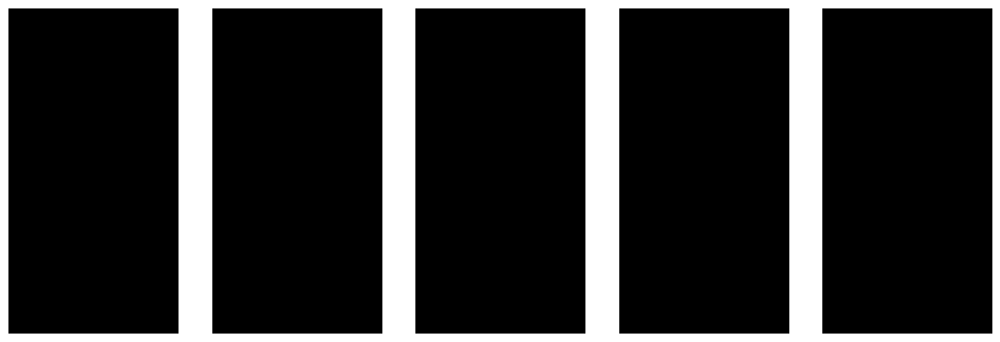

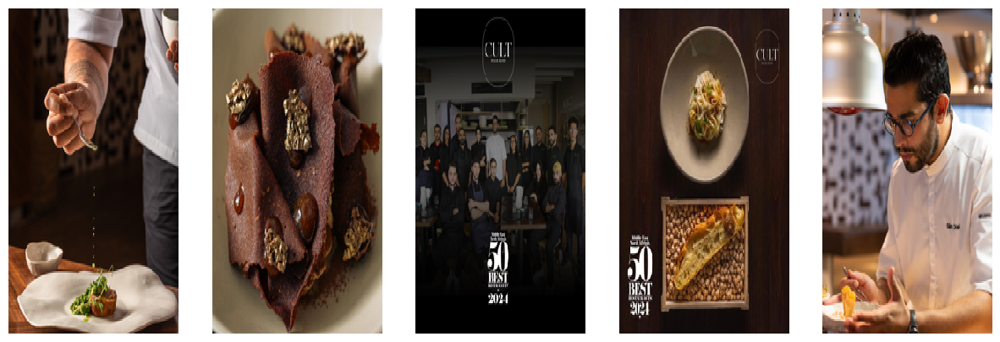

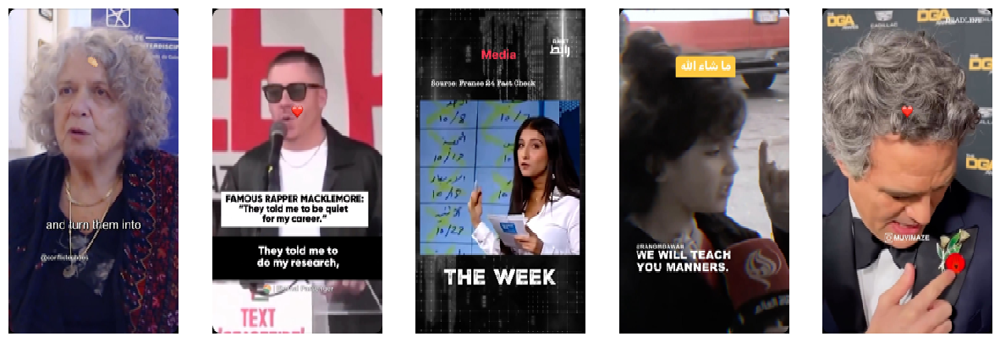

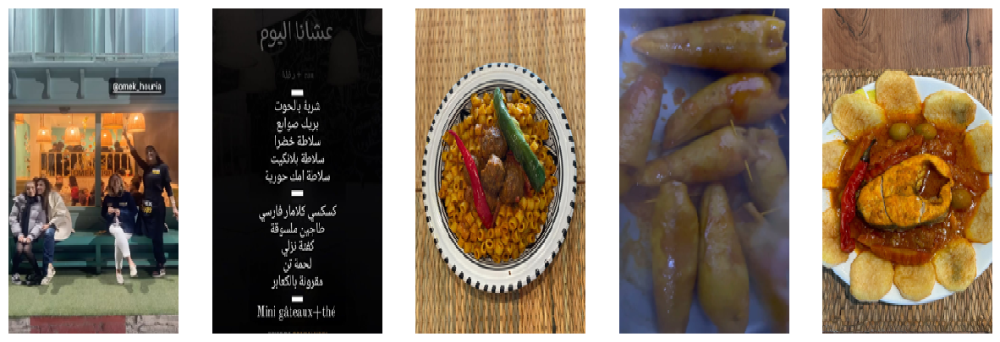

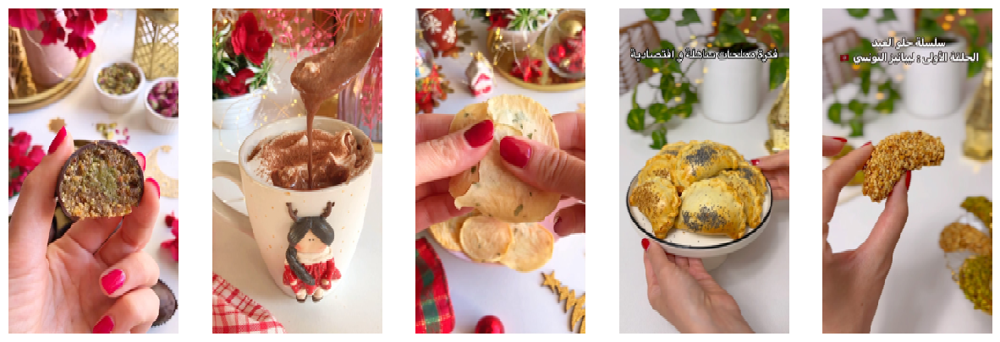

...

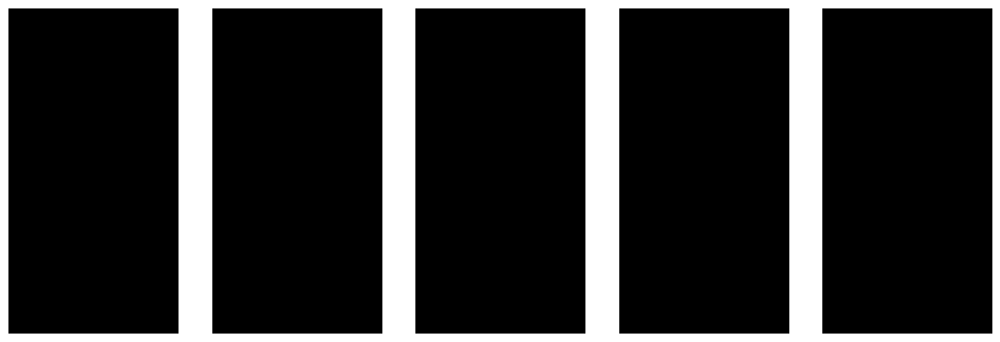

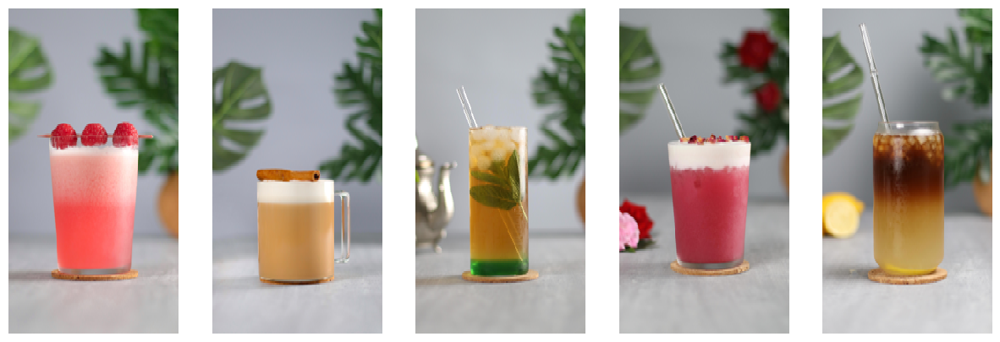

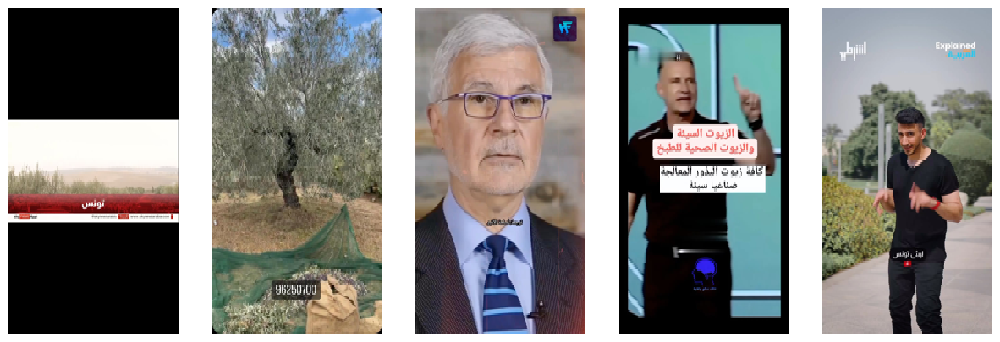

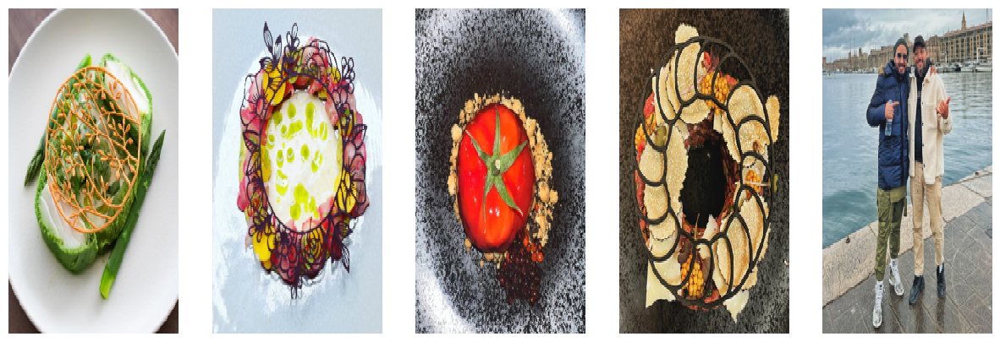

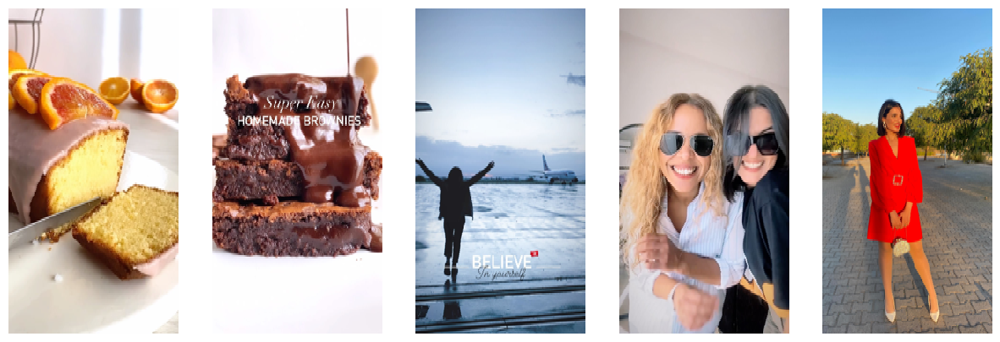

In [33]:
import matplotlib.pyplot as plt
import os
import pickle
IMAGES_NUMBER= 50
def display_images(images_array, titles=None):
    ncols=5
    nimages = len(images_array)
    nrows = (nimages + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(50, 50))

    axes = axes.flatten()
    print(len(images_array))
    for i, img in enumerate(images_array):
        # Plot the image on the appropriate subplot
        axes[i].imshow(img)

        # Add title if provided
        if titles and i < len(titles):
            axes[i].set_title(titles[i])

        # Remove axes for clarity
        axes[i].axis('off')

    # Hide any remaining subplots if there are not enough images
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Display the grid of images
    plt.show()

def display_category_images(desired_categories):
  balanced_df = df[
      df['username'].apply(lambda username: os.path.isfile(os.path.join(batches, f"{username}.pkl")))
  ]
  categories_counts = dict()
  balanced_df = balanced_df[balanced_df['categories'].apply(lambda x: any(cat in desired_categories for cat in x))]
  balanced_df['categories'] = balanced_df['categories'].apply(lambda x: [cat for cat in x if cat in desired_categories] )
  #balanced_df = balanced_df[balanced_df['categories'].apply(lambda x: len(x) == 1 and x[0] in desired_categories)]
  print(len(balanced_df))
  for index,user in balanced_df[10:30].iterrows():
    username=user["username"]
    #print("username",username)
    user_categories=user["categories"]
    #print("categories",df[df["username" ] == username]["categories"])
    images = import_processed_images(username)
    display_images_2(images[:5])


display_category_images(['Food'])

